<a href="https://colab.research.google.com/github/MalihaUCF/Machine-Learning-Course-Assignments-Spring-2019/blob/master/Assignment3/Problem4-new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!ls

cats_and_dogs_fine_tuning_functionalAPI.h5  sample_data


In [0]:
#importing trained model from problem 2
from google.colab import files

uploaded = files.upload()

Saving cats_and_dogs_fine_tuning_functionalAPI.h5 to cats_and_dogs_fine_tuning_functionalAPI.h5


In [0]:
from keras.models import load_model


model=load_model('cats_and_dogs_fine_tuning_functionalAPI.h5')
model.summary()

#last_conv_layer = model.get_layer('block5_conv3')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_______________________________________

In [0]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2019-04-15 19:03:55--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.133.128, 2a00:1450:400c:c06::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.133.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  40.6MB/s    in 1.6s    

2019-04-15 19:03:57 (40.6 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [0]:
#Unzipping the dataset file

import os
import zipfile

local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

In [0]:
#Creating separate folders for cats and dogs - training and valdiation sets

base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

In [0]:
print(validation_cats_dir)
print(len(validation_cats_dir))
print(len(train_dogs_dir))


/tmp/cats_and_dogs_filtered/validation/cats
43
38


In [0]:
!ls /tmp/cats_and_dogs_filtered/validation/cats | head -3
!ls /tmp/cats_and_dogs_filtered/validation/dogs | head -3

cat.2000.jpg
cat.2001.jpg
cat.2002.jpg
dog.2000.jpg
dog.2001.jpg
dog.2002.jpg


In [0]:
img_path2 = '/tmp/cats_and_dogs_filtered/validation/cats/cat.2001.jpg'
img_path = '/tmp/cats_and_dogs_filtered/validation/dogs/dog.2001.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

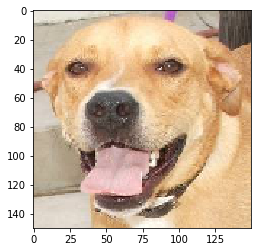

In [0]:
#visualizing a dataset image

%matplotlib inline

import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.grid(False)
plt.show()

In [0]:
model.predict(img_tensor)

array([[0.9999988]], dtype=float32)

In [0]:
#Creating an activation model using keras functional API

from keras import models

layer_outputs = [layer.output for layer in model.layers[1:22]]

activation_model = models.Model(input=model.input, outputs=layer_outputs)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  """


In [0]:
activations = activation_model.predict(img_tensor)
len(activations)

21

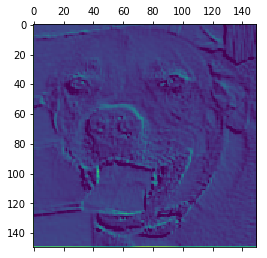

In [0]:
#First layer activation


first_layer_activation = activations[0]
first_layer_activation.shape
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')
plt.grid(False)
plt.show()

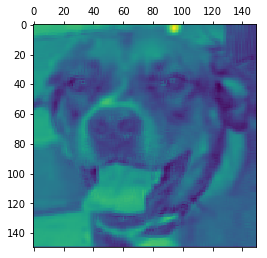

In [0]:
plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.grid(False)
plt.show()

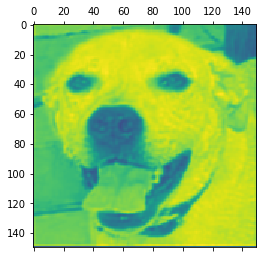

In [0]:
#Second layer activation

second_layer_activation = activations[1]
plt.matshow(second_layer_activation[0, :, :, 4], cmap='viridis')
plt.grid(False)
plt.show()

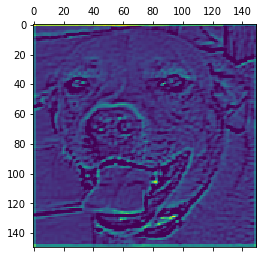

In [0]:
#Final layer activation for filter 6

final_layer_activation = activations[20]
plt.matshow(second_layer_activation[0, :, :, 6], cmap='viridis')
plt.grid(False)
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


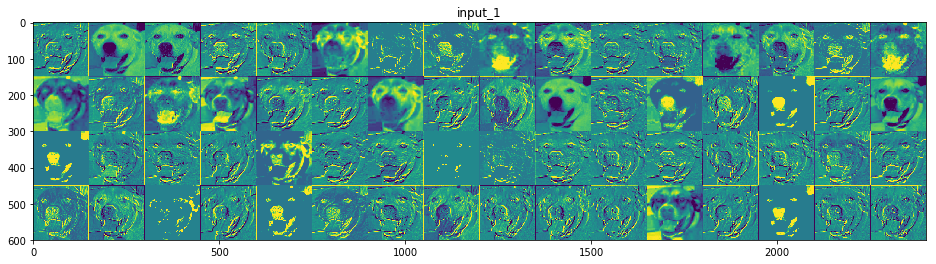

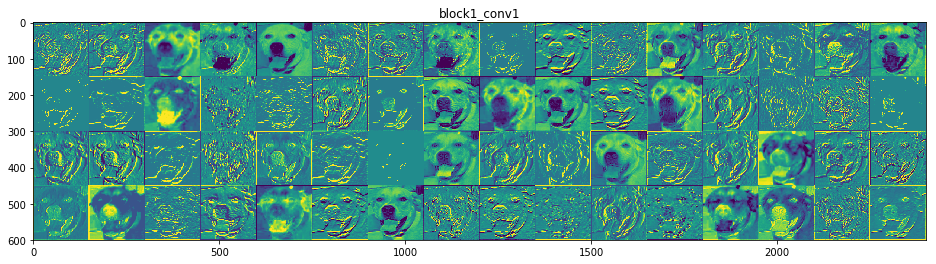

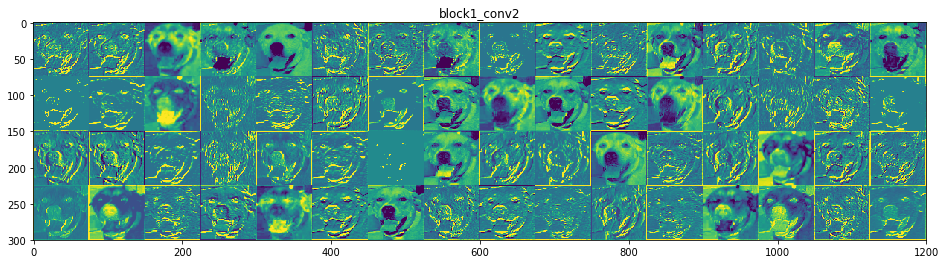

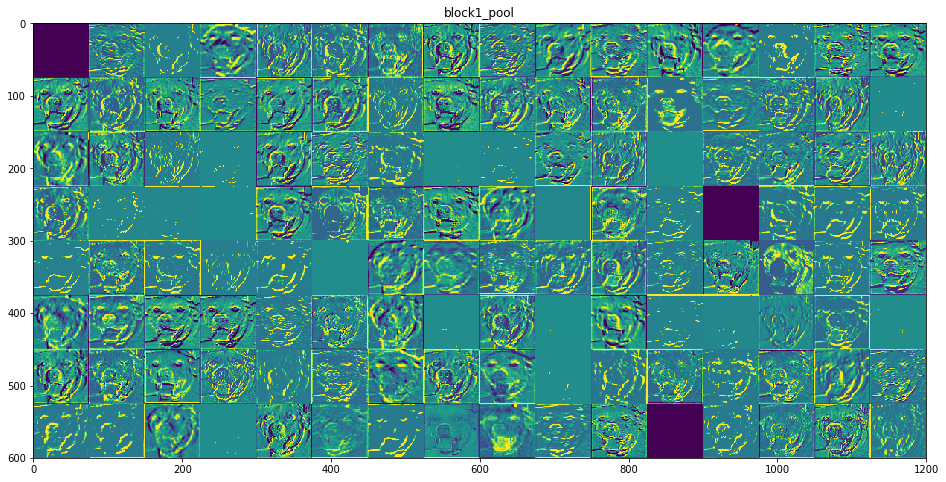

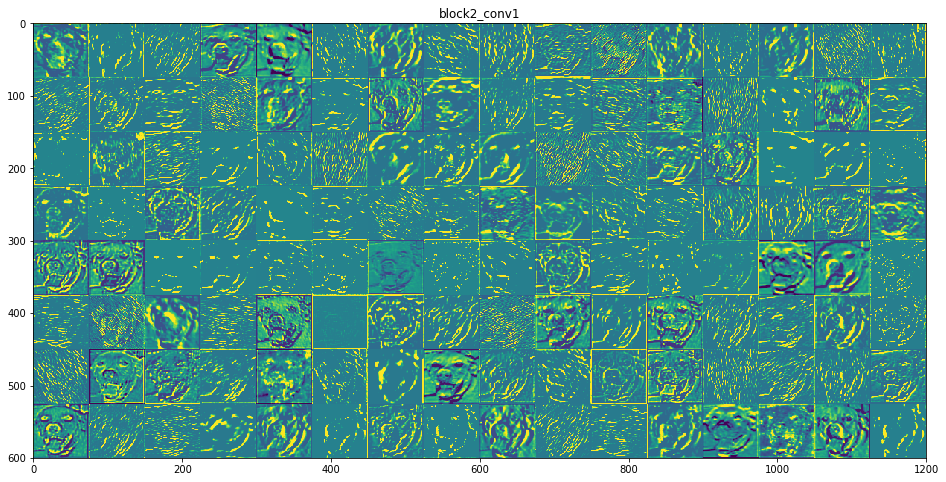

...

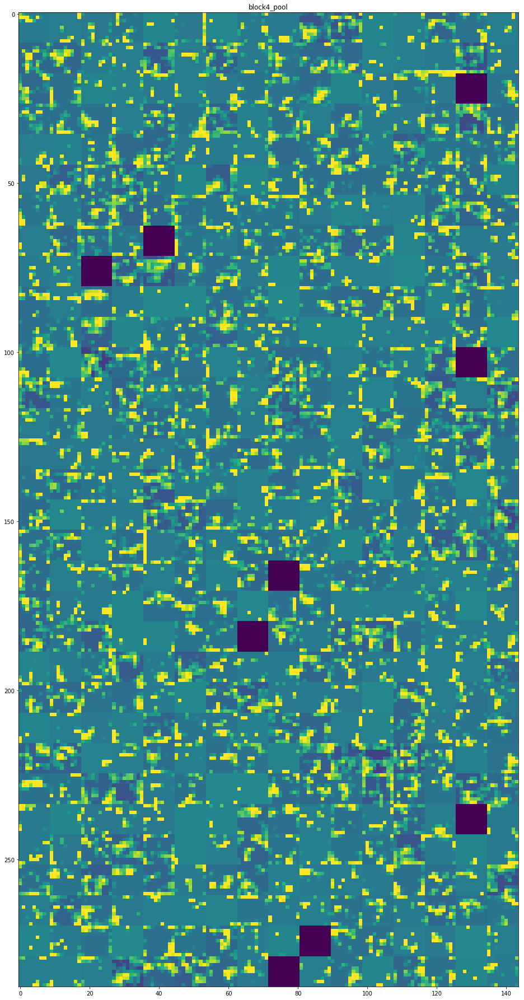

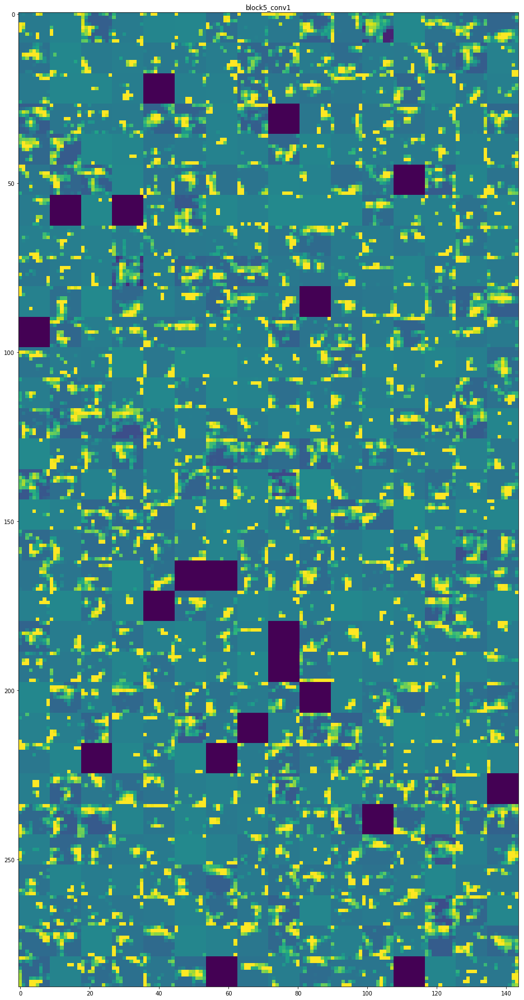

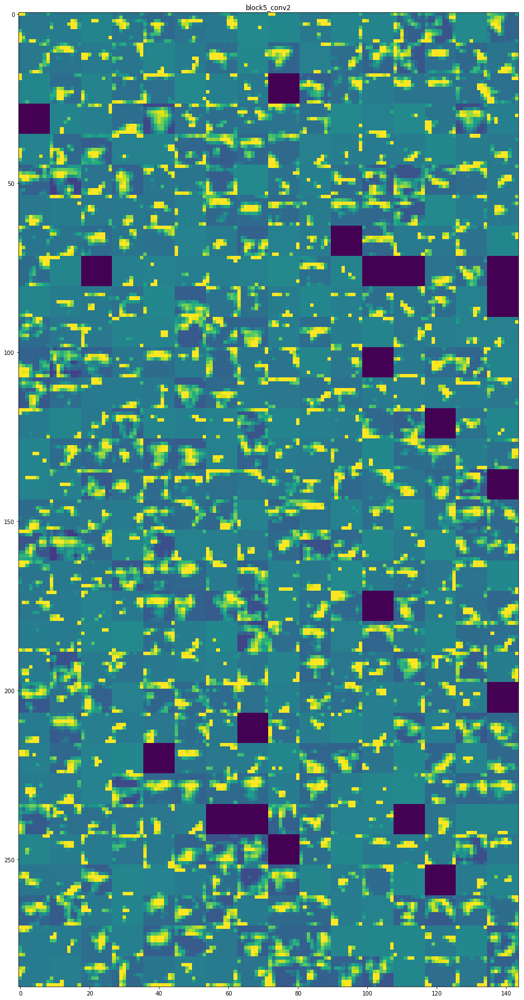

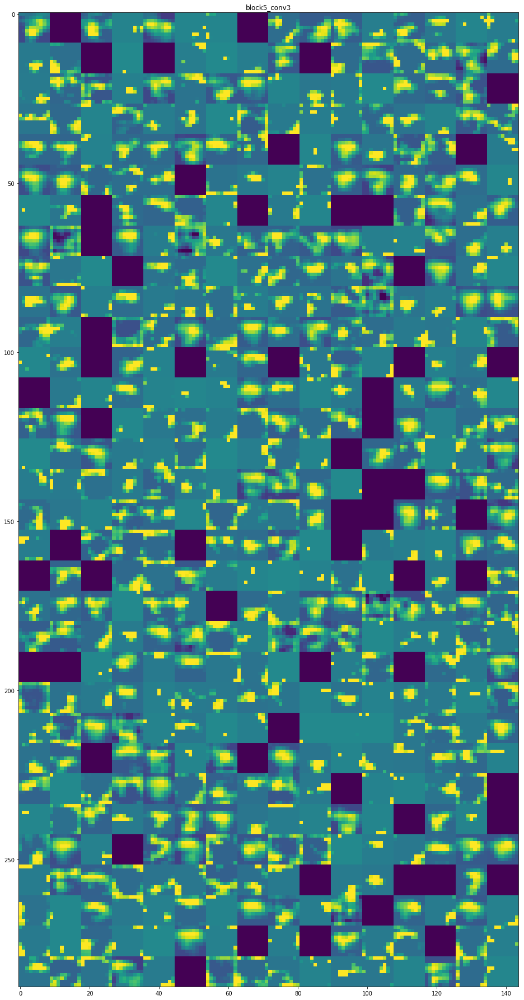

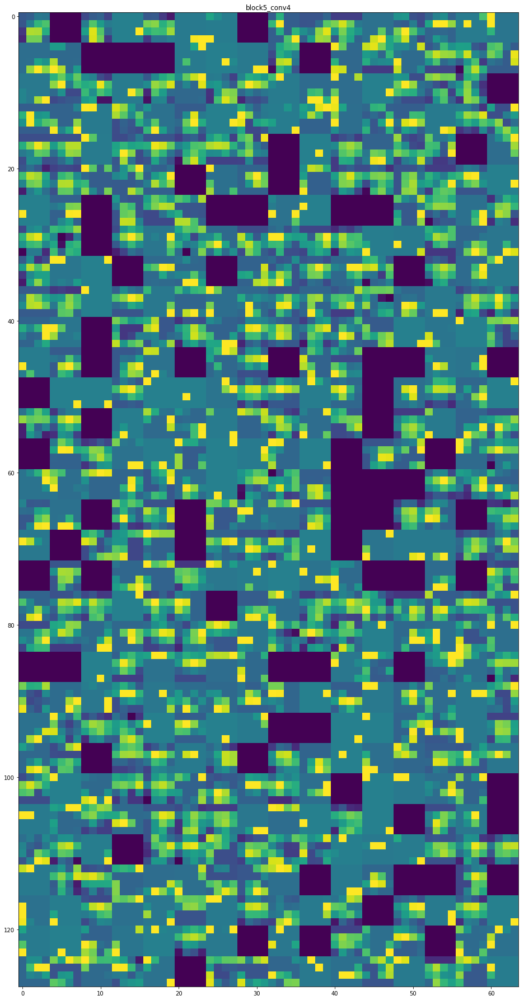

In [0]:
#Displaying activations for different layers of the trained model

layer_names = []

for layer in model.layers[:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

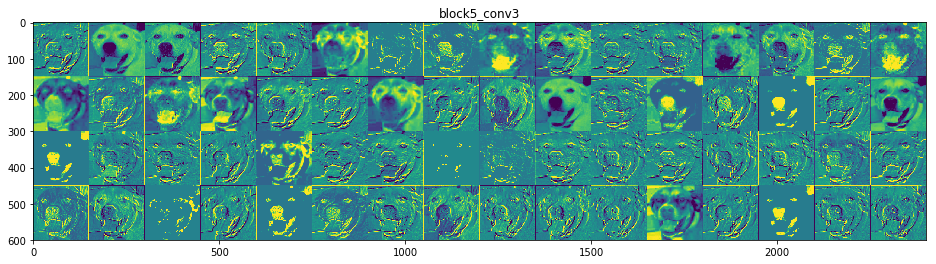

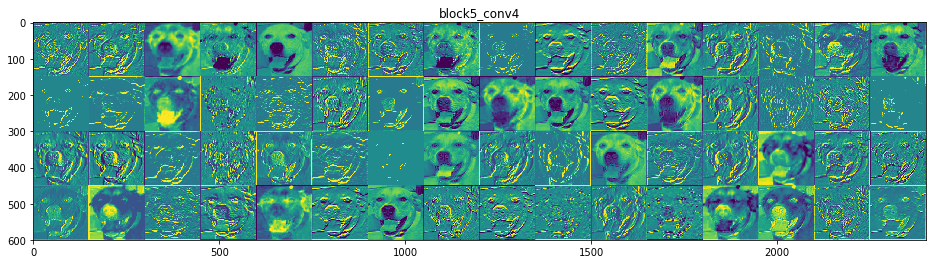

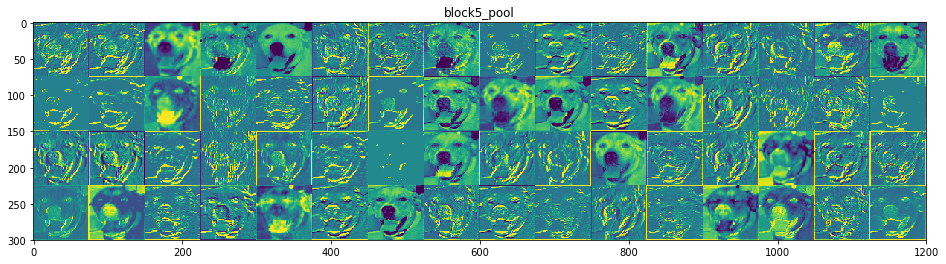

In [0]:
#Printing last conv layer of model obtained in problem 2
#Block 5 of conv layers being shown here


layer_names = []


#using only last 3 layers of final conv block of model
for layer in model.layers[19:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

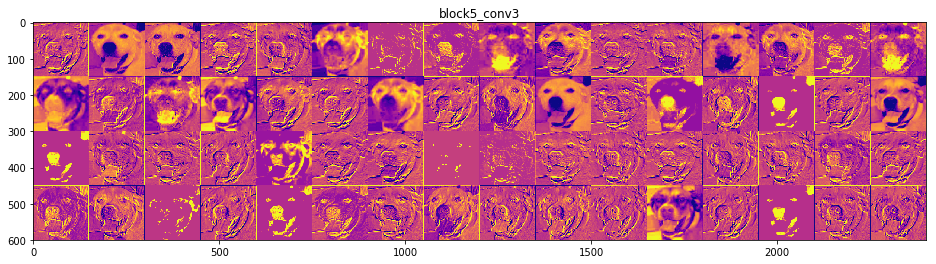

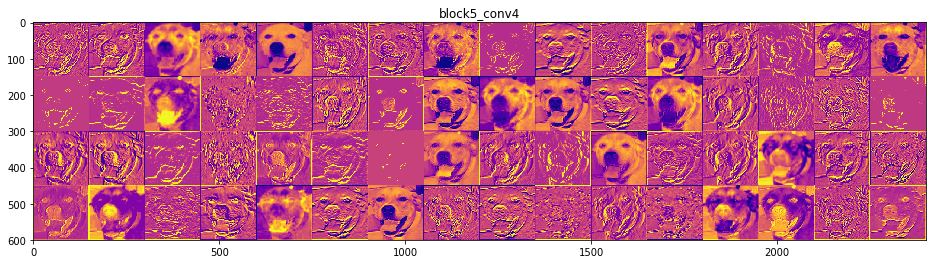

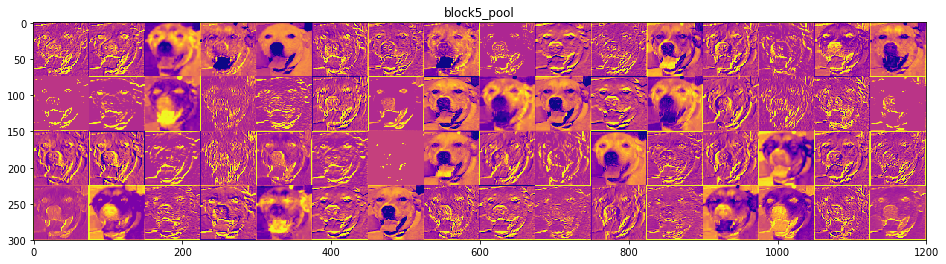

In [0]:
#Printing last conv layer of model obtained in problem 2 using different cmap view for dogs validation set
#Block 5 of conv layers being shown here


layer_names = []


#using only last 3 layers of final conv block of model
for layer in model.layers[19:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='plasma')

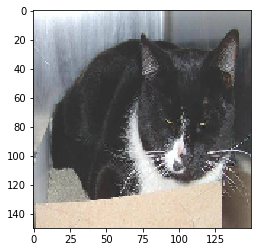

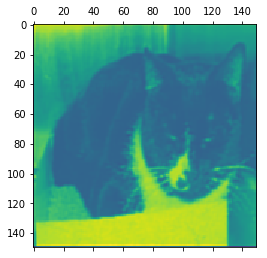

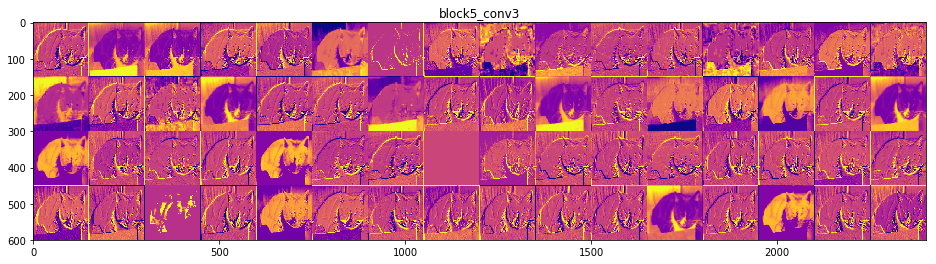

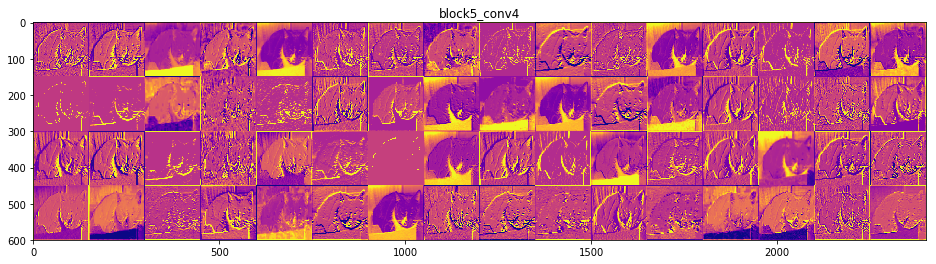

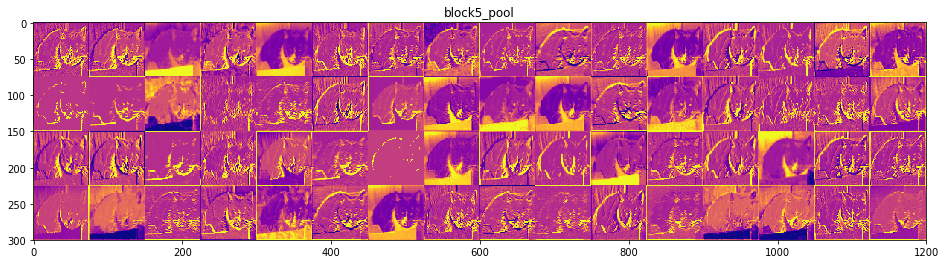

In [0]:
#Printing last conv layer of model obtained in problem 2 using different cmap view for cats validation set
#Block 5 of conv layers being shown here


img_path2 = '/tmp/cats_and_dogs_filtered/validation/cats/cat.2001.jpg'
img_path = '/tmp/cats_and_dogs_filtered/validation/dogs/dog.2001.jpg'

from keras.preprocessing import image
import numpy as np

img2 = image.load_img(img_path2, target_size=(150, 150))
img_tensor2 = image.img_to_array(img2)
img_tensor2 = np.expand_dims(img_tensor2, axis=0)
img_tensor2 /= 255.

activations2 = activation_model.predict(img_tensor2)
len(activations2)


%matplotlib inline

import matplotlib.pyplot as plt

plt.imshow(img_tensor2[0])
plt.grid(False)
plt.show()

#Second layer activation

second_layer_activation2 = activations2[1]
plt.matshow(second_layer_activation2[0, :, :, 4], cmap='viridis')
plt.grid(False)
plt.show()


layer_names = []


#using only last 3 layers of final conv block of model
for layer in model.layers[19:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations2):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='plasma')



---



**Creating t-SNE for the final output of the trained model**


---




In [0]:
from keras import models
layer = model.get_layer('fc2')
layer_output = layer.output

activation_model_tSNE = models.Model(input=model.input, outputs=[layer_output])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  """


In [0]:
#Creating a combined test set for cats and dogs 
#creating a test label set for the images also


img_path2 = '/tmp/cats_and_dogs_filtered/validation/cats/cat.2001.jpg'
img_path = '/tmp/cats_and_dogs_filtered/validation/dogs/dog.2001.jpg'

from keras.preprocessing import image
import numpy as np
import os

images=os.listdir(validation_cats_dir)
images2=os.listdir(validation_dogs_dir)
print(images)
print(images2)


test_images=[]
test_labels=[]

for img in images:
  img_path=os.path.join(validation_cats_dir+'/'+img)  
  img = image.load_img(img_path, target_size=(150, 150))
  img_tensor = image.img_to_array(img)
  #img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255.
  label=0
  test_images.append(img_tensor)
  test_labels.append(label)

  
for img in images2:
  img_path=os.path.join(validation_dogs_dir+'/'+img)  
  img = image.load_img(img_path, target_size=(150, 150))
  img_tensor = image.img_to_array(img)
  #img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255.
  label=1
  test_images.append(img_tensor)
  test_labels.append(label)  



  
test_images=np.array(test_images)
test_labels=np.array(test_labels,dtype=np.int8)
print(test_images.shape)
print(test_labels.shape)

activations = activation_model_tSNE.predict(test_images)
print(activations.shape)
activations[0]

In [0]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
%matplotlib inline
import seaborn as sns

In [0]:
#defining function to display scatter plot

class_names = ['cats','dogs']


def data_scatter(vecs, labels):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(labels))
    palette = np.array(sns.color_palette("husl", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(12, 12))
    ax = plt.subplot(aspect='equal')
    #labels=int(labels)
    sc = ax.scatter(vecs[:, 0], vecs[:, 1], c=palette[labels])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')


    for idx in range(num_classes):

        # Place label at median position of vectors with corresponding label

        x_coord, y_coord = np.median(vecs[labels == idx, :], axis=0)
        txt = ax.text(x_coord, y_coord, class_names[idx], fontsize=16)
        # plot class index black with white contour
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=6, foreground="w"),
            PathEffects.Normal()])

t-SNE done! Time elapsed: 9.397385597229004 seconds


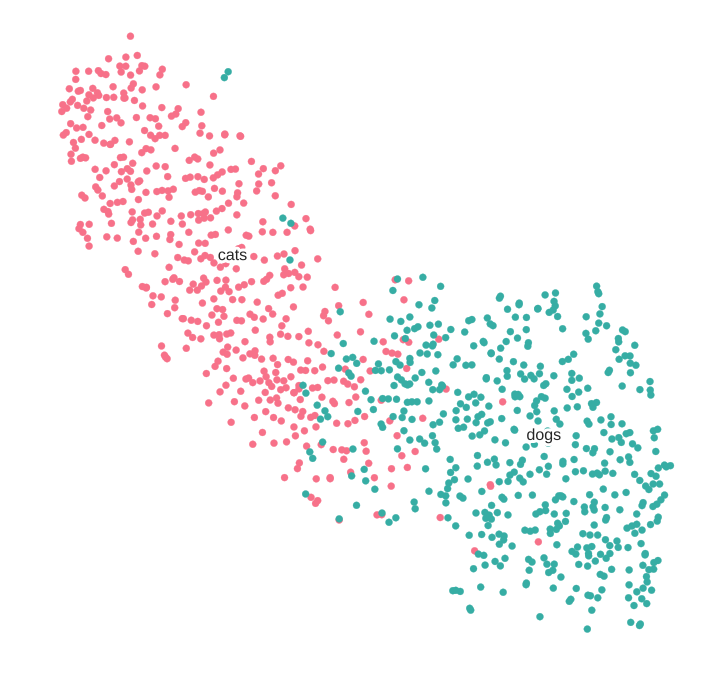

In [0]:
from sklearn.manifold import TSNE
import time
time_start = time.time()

fashion_tsne = TSNE(random_state=42).fit_transform(activations)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

# visualize t-SNE output
data_scatter(fashion_tsne, test_labels)